# Pneumonia MNIST Simple CNN

## Step 1 - Import Libraries

In [1]:
import warnings
warnings.simplefilter("ignore")

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pickle
import shap
import torch
import torch.nn as nn
import torch.optim as optim

from pathlib import Path

SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)

print("PyTorch version:", torch.__version__)
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device:", DEVICE)

PyTorch version: 2.5.1
device: cpu


In [3]:
import torchvision
from torchvision import datasets, transforms
from torchvision.utils import make_grid
from torch.utils.data import random_split, DataLoader

In [4]:
from utils import (
    GradCAM,
    SimpleCNN,
)

from utils import (
    get_class_names_from_idxs,
    plot_class_distribution,
    train_model,
    evaluate_model,
    plot_training_metrics,
    convert_np_to_tensor,
    model_predict,
)

from utils import (
    gradcam_explain_image,
    lime_explain_image,
    shap_explain_images
)

## Step 2 - Load the dataset

> https://medmnist.com/

In [5]:
PROJECT_DIR = "/Users/brusnto/Doutorado/XAI/ProjetoFinal"
DATASET_NAME = "pneumoniamnist_224"

DATA_ROOT = f"{PROJECT_DIR}/datasets/{DATASET_NAME}"
MODELS_PATH = f"{PROJECT_DIR}/models"
METRICS_PATH = f"{PROJECT_DIR}/metrics"

MODEL_FILE_NAME = f"{MODELS_PATH}/{DATASET_NAME}_simpleCNN.pth"
METRICS_FILE_NAME =  METRICS_PATH + "/{type}_" + DATASET_NAME + "_simpleCNN.pkl"

BATCH_SIZE = 64

print(f"Model file: {MODEL_FILE_NAME}")
print(f"Model file: {METRICS_FILE_NAME}")

Model file: /Users/brusnto/Doutorado/XAI/ProjetoFinal/models/pneumoniamnist_224_simpleCNN.pth
Model file: /Users/brusnto/Doutorado/XAI/ProjetoFinal/metrics/{type}_pneumoniamnist_224_simpleCNN.pkl


In [6]:
Path(MODELS_PATH).mkdir(parents=True, exist_ok=True)
Path(METRICS_PATH).mkdir(parents=True, exist_ok=True)

In [7]:
# Resize all images to 224x224
transform_image_resize = transforms.Compose([
    transforms.Resize(size = (224, 224)),
    transforms.ToTensor(),
])

In [8]:
# Read images
train_ds = datasets.ImageFolder(
    f"{DATA_ROOT}/train/",
    transform=transform_image_resize
)
val_ds = datasets.ImageFolder(
    f"{DATA_ROOT}/val/",
    transform=transform_image_resize
)
test_ds = datasets.ImageFolder(
    f"{DATA_ROOT}/test/",
    transform=transform_image_resize
)

print(type(train_ds))

<class 'torchvision.datasets.folder.ImageFolder'>


In [9]:
CLASS_TO_IDX_MAP = train_ds.class_to_idx
CLASS_NAMES = list(CLASS_TO_IDX_MAP.keys())
N_CLASSES = len(CLASS_NAMES)

CLASS_TO_IDX_MAP

{'normal': 0, 'pneumonia': 1}

In [10]:
train_loader = DataLoader(
    train_ds,
    batch_size=BATCH_SIZE,
    shuffle=True
)
val_loader = DataLoader(
    val_ds,
    batch_size=BATCH_SIZE,
    shuffle=True
)
test_loader = DataLoader(
    test_ds,
    batch_size=BATCH_SIZE,
    shuffle=True
)
print(type(train_loader))

<class 'torch.utils.data.dataloader.DataLoader'>


In [11]:
total_train = len(train_loader.dataset)
total_val = len(val_loader.dataset)
total_test = len(test_loader.dataset)

print(f"Train: {total_train}")
print(f"Validation: {total_val}")
print(f"Test: {total_test}")
print(f"Total: {total_train + total_val + total_test}")

Train: 4708
Validation: 524
Test: 624
Total: 5856


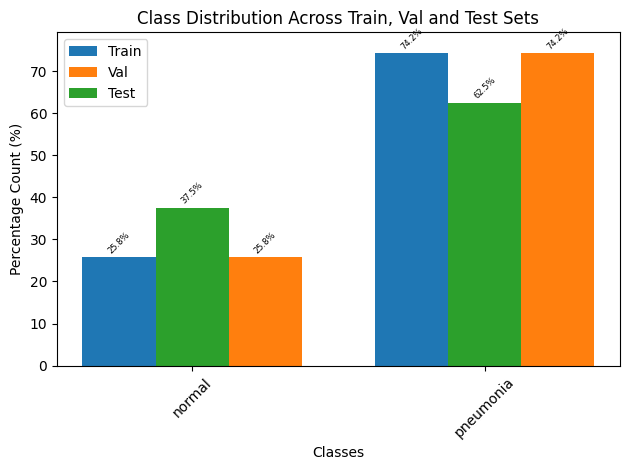

In [12]:
plot_class_distribution(train_ds, val_ds, test_ds, CLASS_NAMES)

In [13]:
sample_train_images, sample_train_torch_labels = next(iter(train_loader))

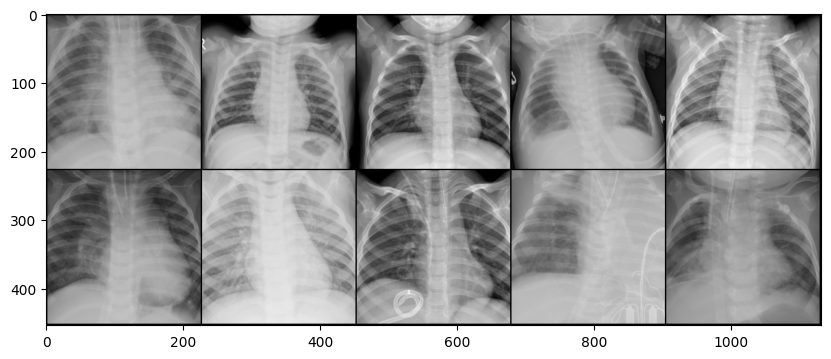

<class 'torch.Tensor'>


In [14]:
# Print 10 first training images
sample_train_images = sample_train_images[:10]
sample_train_torch_labels = sample_train_torch_labels[:10]
grid_img = make_grid(sample_train_images, 5)

%matplotlib inline
plt.figure(figsize = (10,10))
plt.imshow(grid_img.permute(1, 2, 0))
plt.show()
print(type(sample_train_images))

## Step 3 - Train CNN

In [15]:
model = SimpleCNN(N_CLASSES).to(DEVICE)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=1e-3)

In [16]:
LOAD_MODEL = True

In [17]:
if LOAD_MODEL:
    model.load_state_dict(torch.load(MODEL_FILE_NAME, map_location=DEVICE))
    # Load the dictionaries from pickle files
    with open(METRICS_FILE_NAME.format(type="train"), "rb") as train_file:
        train_metrics = pickle.load(train_file)
    with open(METRICS_FILE_NAME.format(type="val"), "rb") as val_file:
        val_metrics = pickle.load(val_file)
else:
    train_metrics, val_metrics = train_model(
        model, train_loader, val_loader, criterion, optimizer, DEVICE, CLASS_NAMES, MODEL_FILE_NAME
    )
    # Save the dictionaries as pickle files
    with open(METRICS_FILE_NAME.format(type="train"), "wb") as train_file:
        pickle.dump(train_metrics, train_file)
    with open(METRICS_FILE_NAME.format(type="val"), "wb") as val_file:
        pickle.dump(val_metrics, val_file)

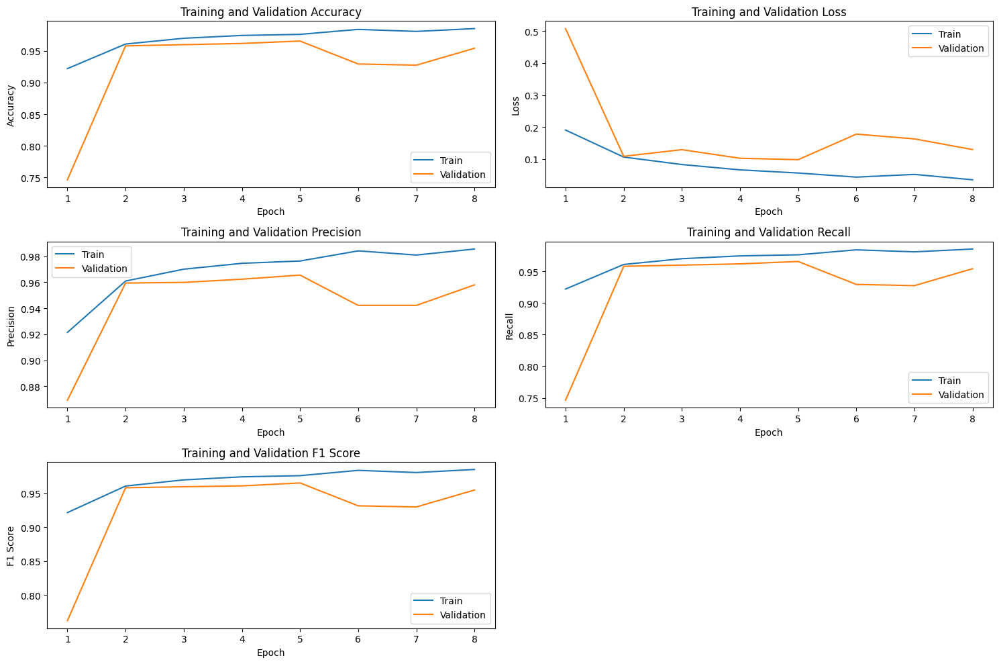

In [18]:
plot_training_metrics(train_metrics, val_metrics)

## Step 4 - Evaluate CNN

In [19]:
test_loss, test_accuracy, test_precision, test_recall, test_f1 = evaluate_model(
    model, test_loader, criterion, DEVICE, CLASS_NAMES, print_cf_report=True
)

print("\nTest Results:")
print(f"Test Loss: {test_loss:.4f}, Accuracy: {test_accuracy:.4f}, Precision: {test_precision:.4f}, Recall: {test_recall:.4f}, F1-Score: {test_f1:.4f}")

              precision    recall  f1-score   support

      normal       0.93      0.77      0.85       234
   pneumonia       0.88      0.97      0.92       390

    accuracy                           0.89       624
   macro avg       0.90      0.87      0.88       624
weighted avg       0.90      0.89      0.89       624


Test Results:
Test Loss: 0.4965, Accuracy: 0.8942, Precision: 0.8978, Recall: 0.8942, F1-Score: 0.8919


## Step 5 - Predict Sample Images

In [20]:
sample_images, sample_torch_labels = next(iter(test_loader))
sample_images_dicts = [''] * len(sample_images)

for i in range(len(sample_images)):
    sample_images_dicts[i] = {}
    sample_images_dicts[i]['image'] = sample_images[i]
    sample_images_dicts[i]['label'] = get_class_names_from_idxs(sample_torch_labels[i], CLASS_TO_IDX_MAP)[0]
    predicted = np.argmax(model_predict(model, sample_images[i], DEVICE))
    sample_images_dicts[i]['pred_label'] = get_class_names_from_idxs(predicted, CLASS_TO_IDX_MAP)[0]

## Step 6 - Retrieve LIME Explanation

In [21]:
SAMPLE_TEST_IMAGE_INDEXES = [1, 2, 3, 4, 5, 8, 16, 19, 20, 21, 25, 35, 38, 39, 40, 51, 52, 53, 54, 55]

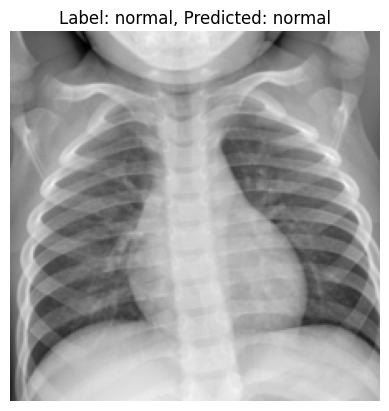

100%|███████████████████████████████████████| 1000/1000 [00:10<00:00, 92.30it/s]


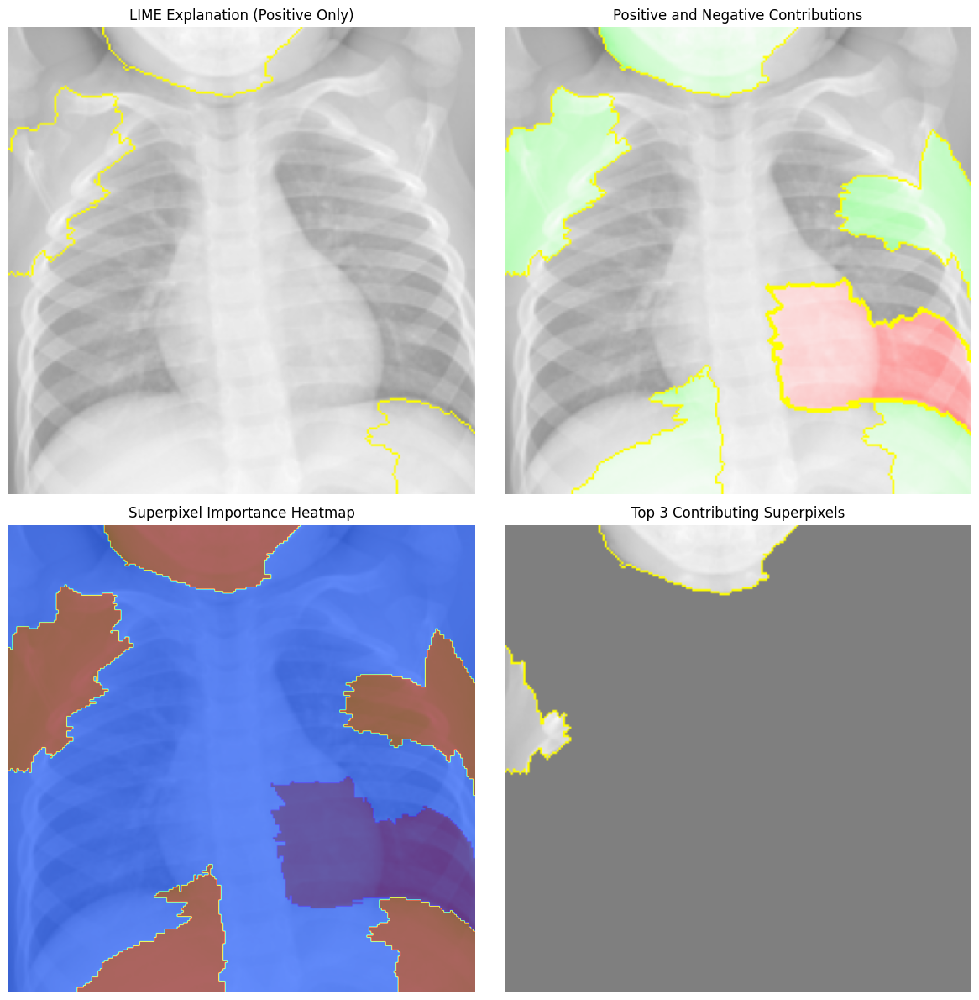

------------------------------------------------------------------------------------------------------------------------


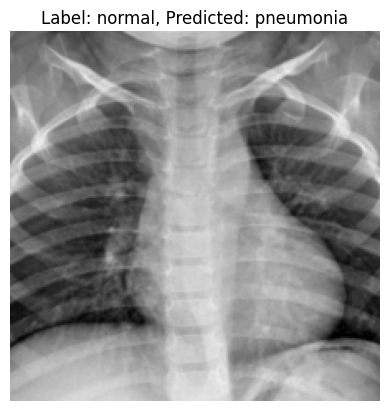

100%|███████████████████████████████████████| 1000/1000 [00:11<00:00, 85.79it/s]


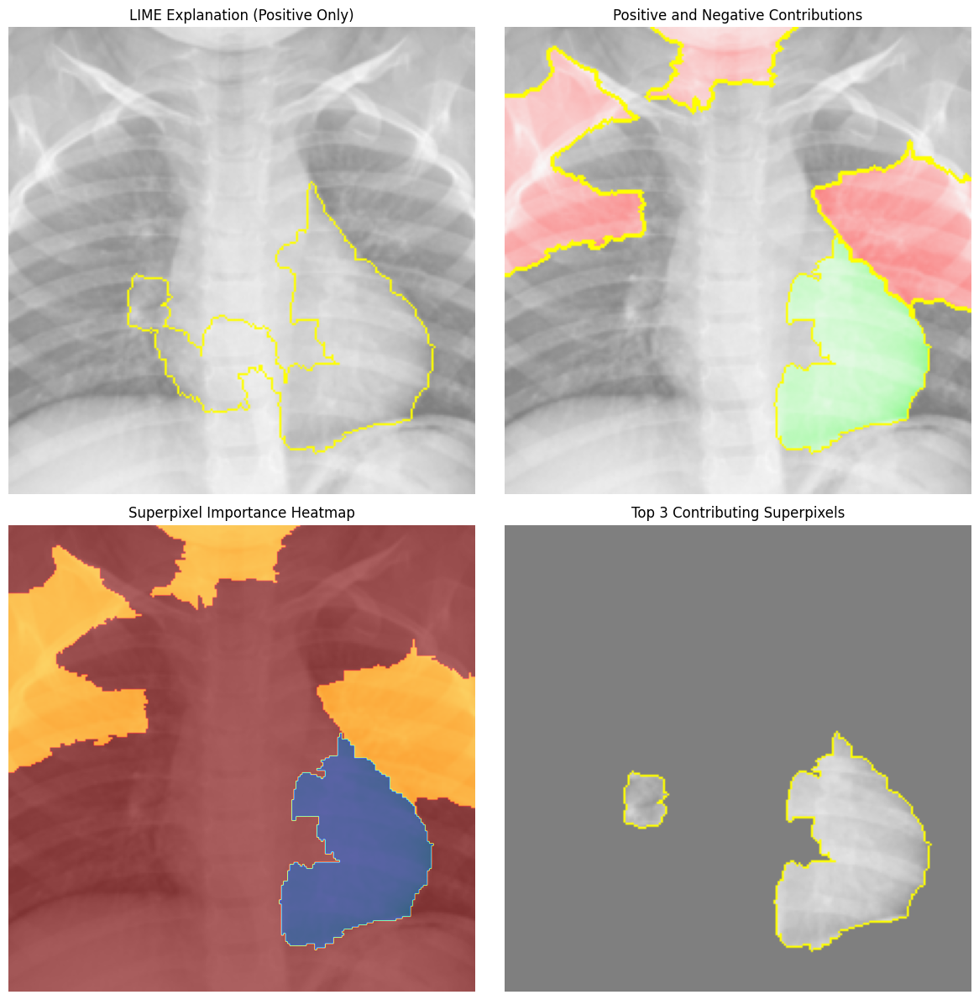

------------------------------------------------------------------------------------------------------------------------


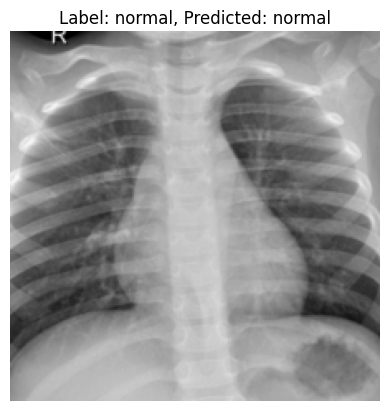

100%|██████████████████████████████████████| 1000/1000 [00:09<00:00, 106.45it/s]


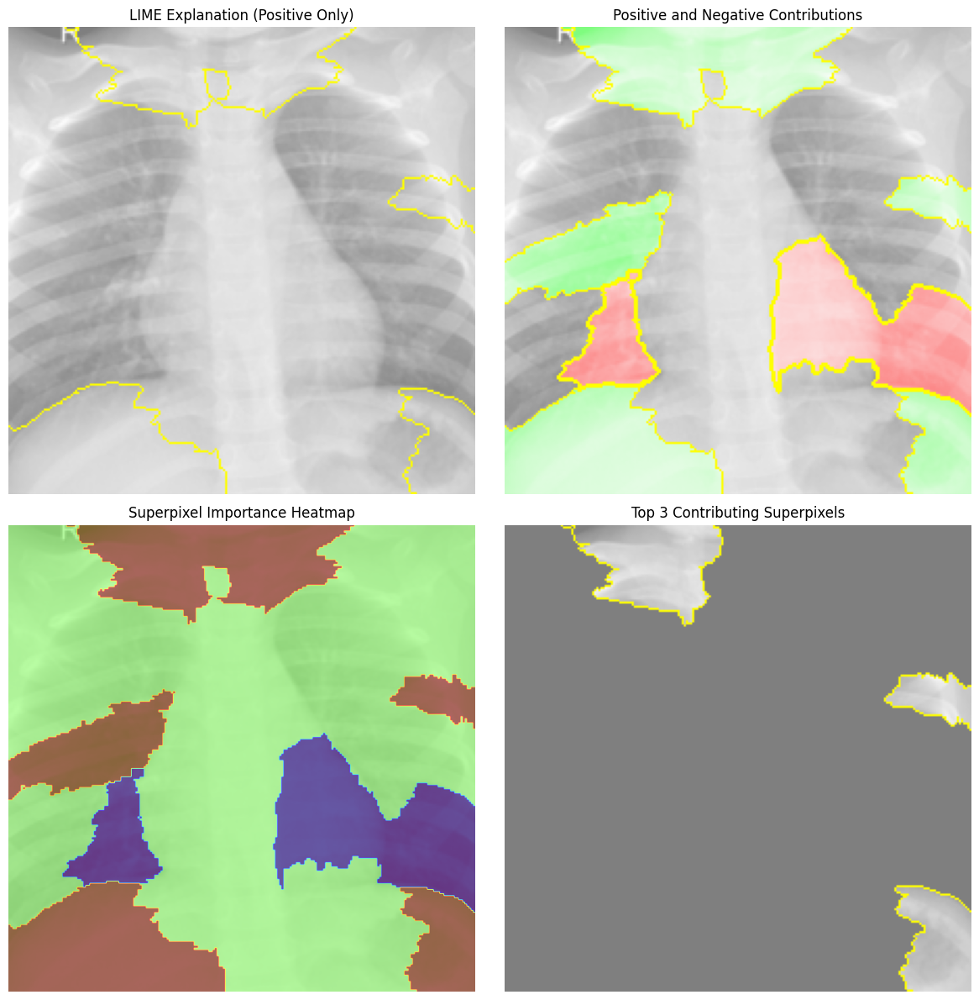

------------------------------------------------------------------------------------------------------------------------


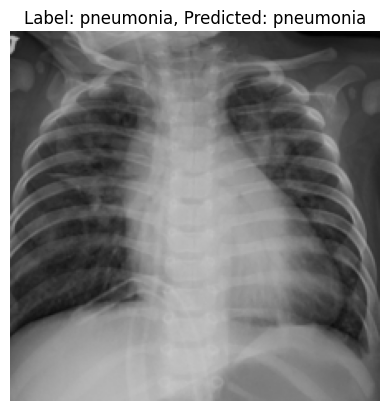

100%|███████████████████████████████████████| 1000/1000 [00:10<00:00, 98.94it/s]


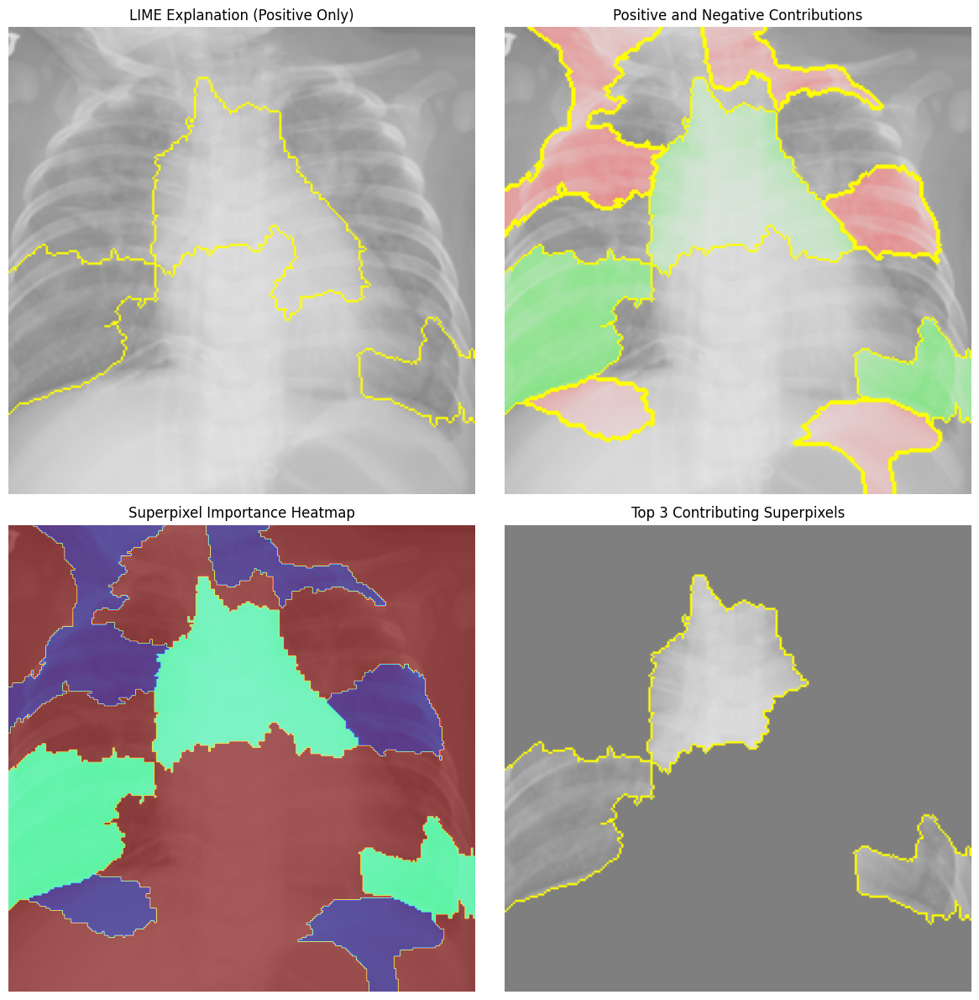

------------------------------------------------------------------------------------------------------------------------


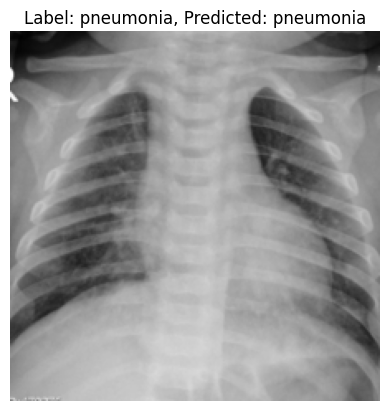

100%|██████████████████████████████████████| 1000/1000 [00:09<00:00, 100.24it/s]


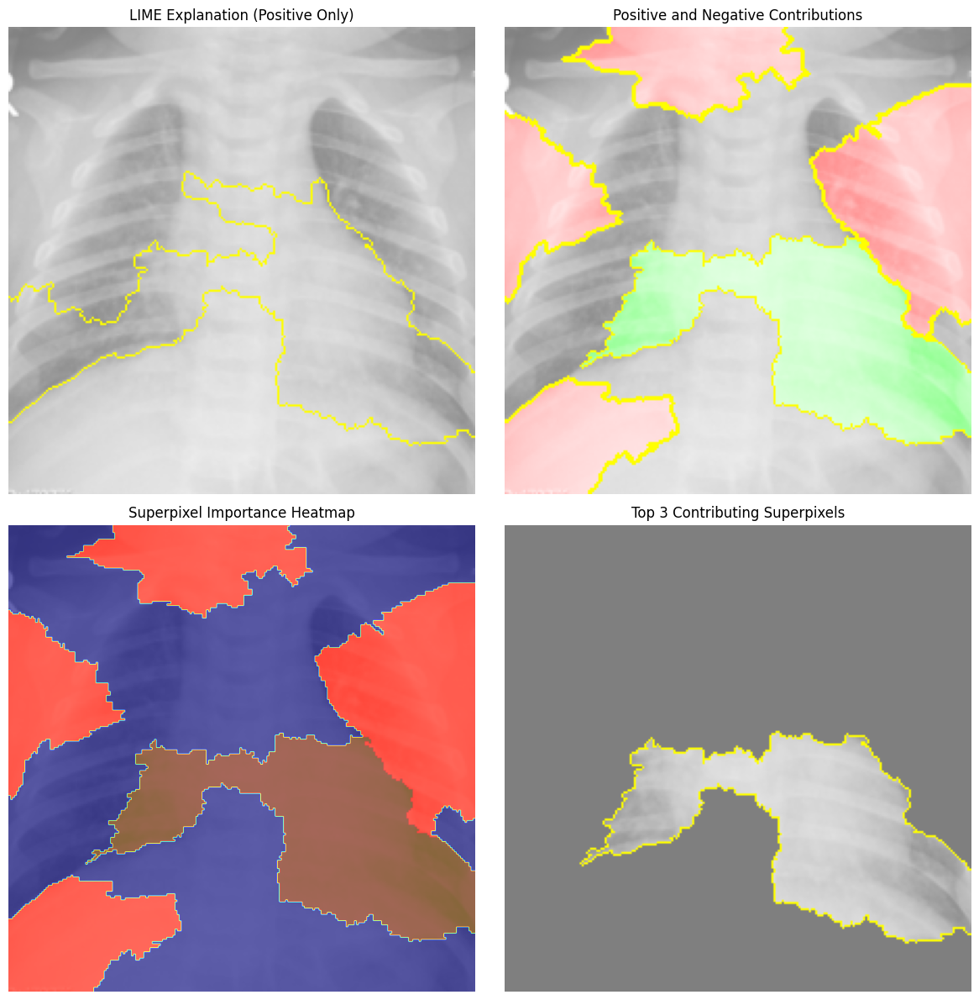

------------------------------------------------------------------------------------------------------------------------


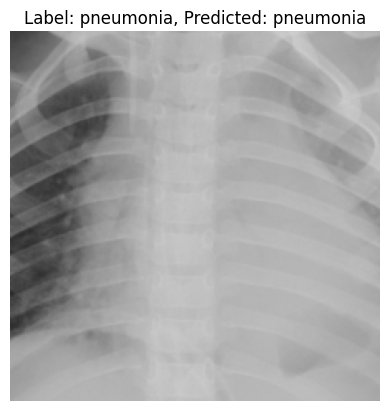

100%|███████████████████████████████████████| 1000/1000 [00:10<00:00, 91.77it/s]


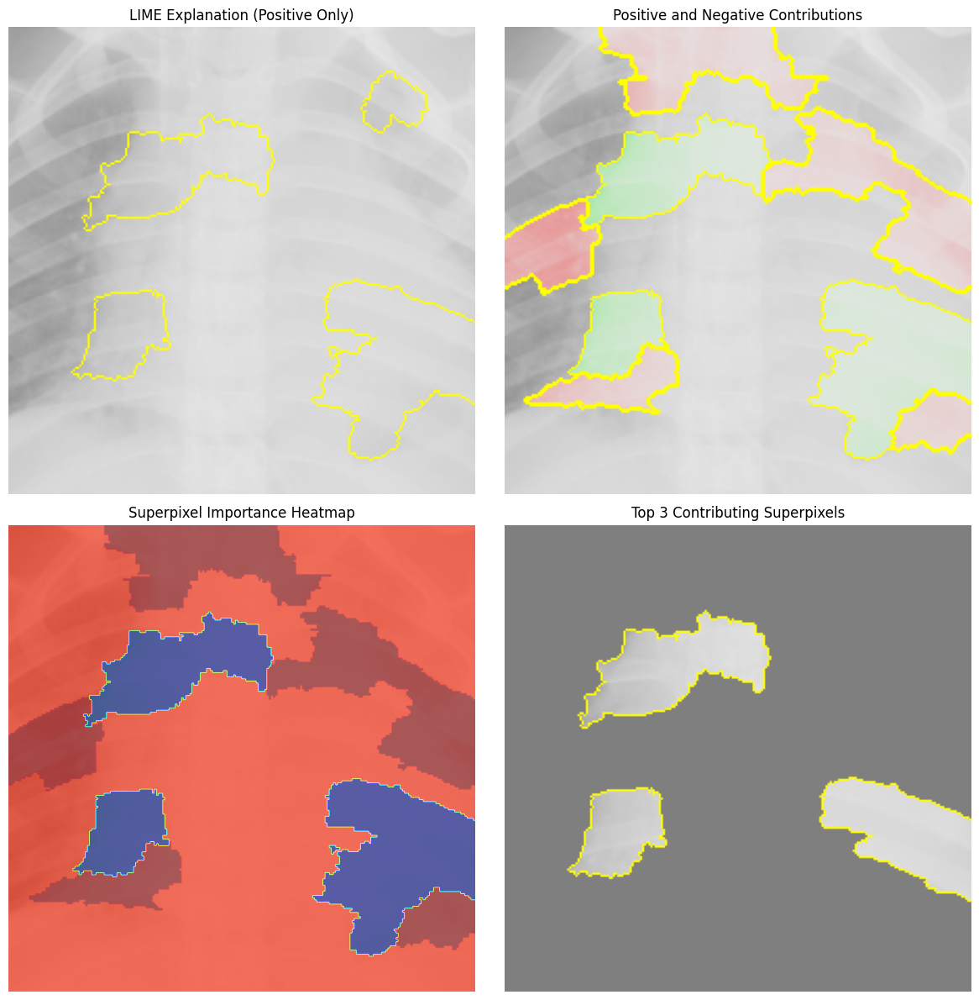

------------------------------------------------------------------------------------------------------------------------


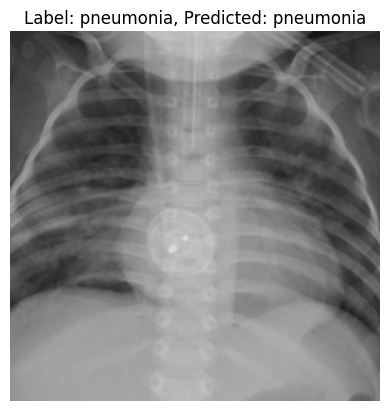

100%|███████████████████████████████████████| 1000/1000 [00:10<00:00, 99.84it/s]


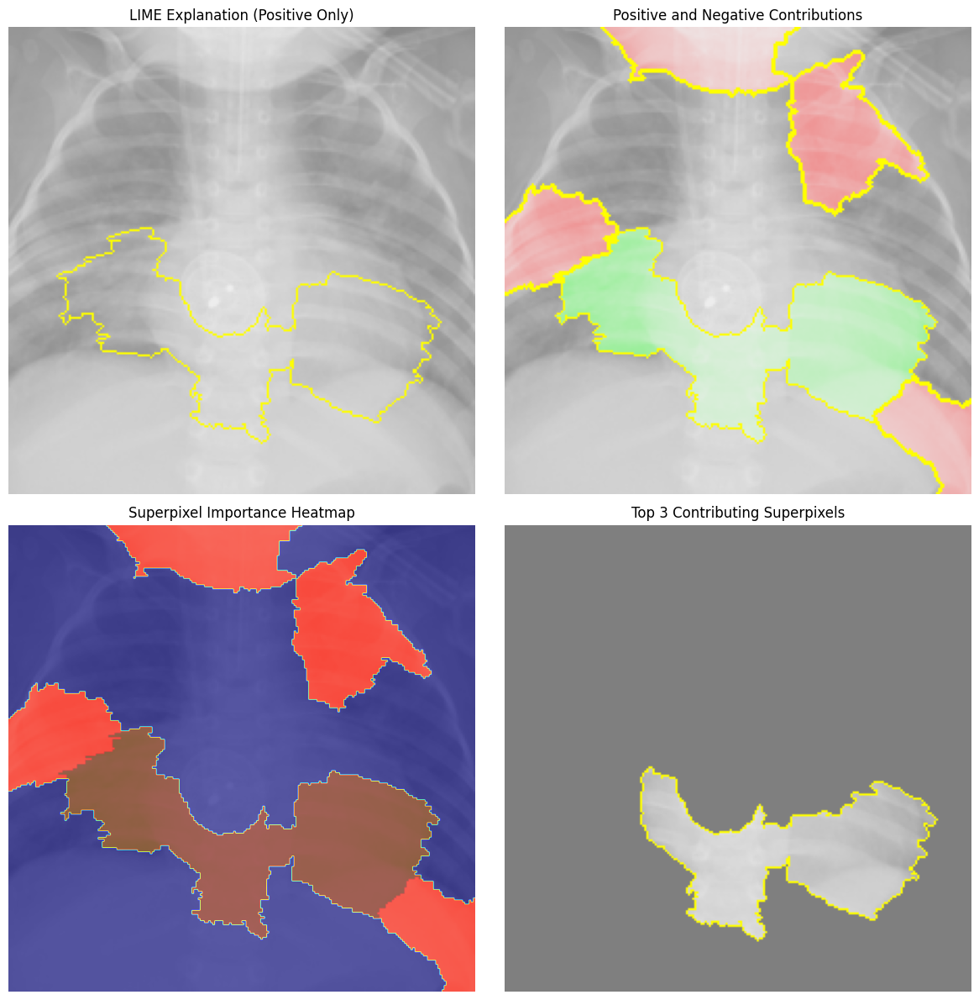

------------------------------------------------------------------------------------------------------------------------


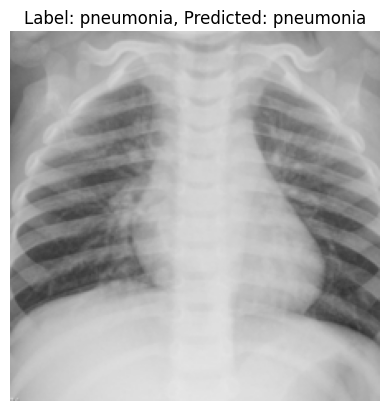

100%|███████████████████████████████████████| 1000/1000 [00:11<00:00, 88.25it/s]


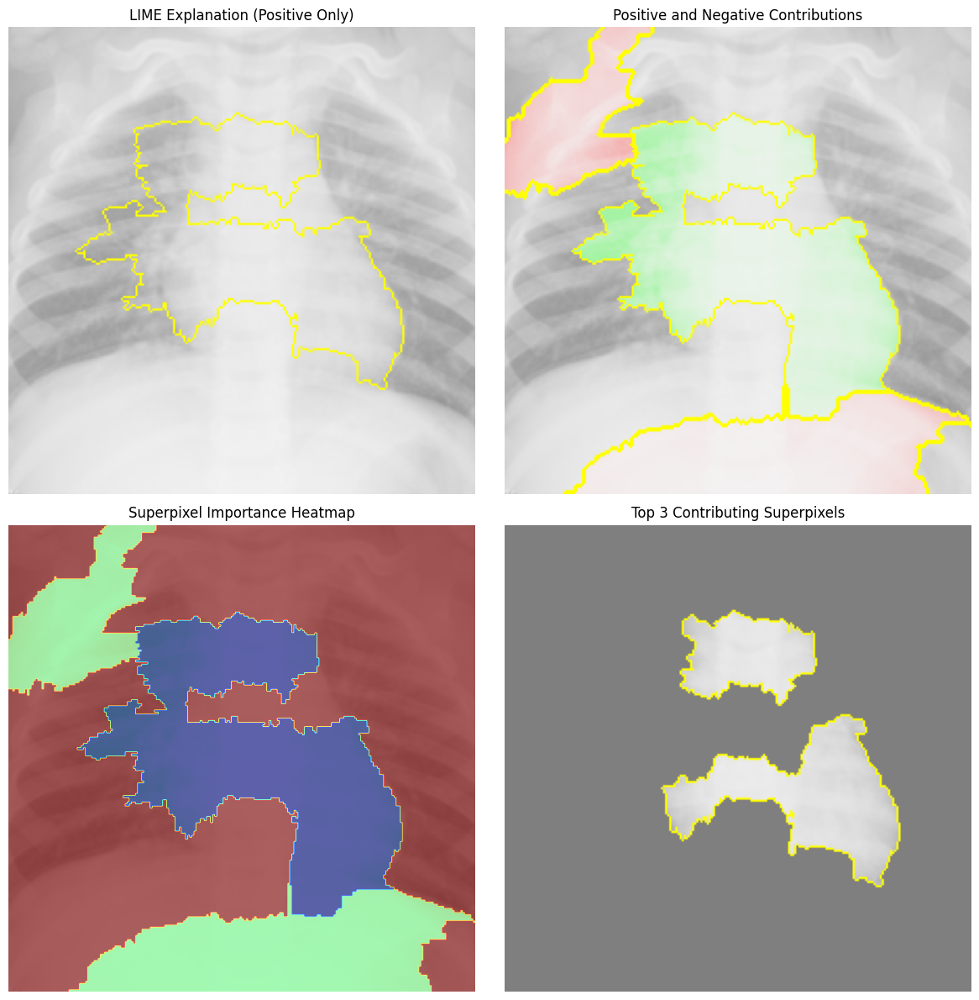

------------------------------------------------------------------------------------------------------------------------


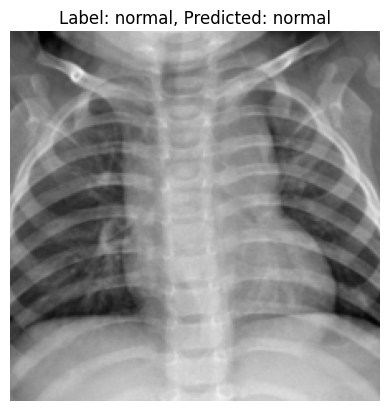

100%|██████████████████████████████████████| 1000/1000 [00:09<00:00, 101.66it/s]


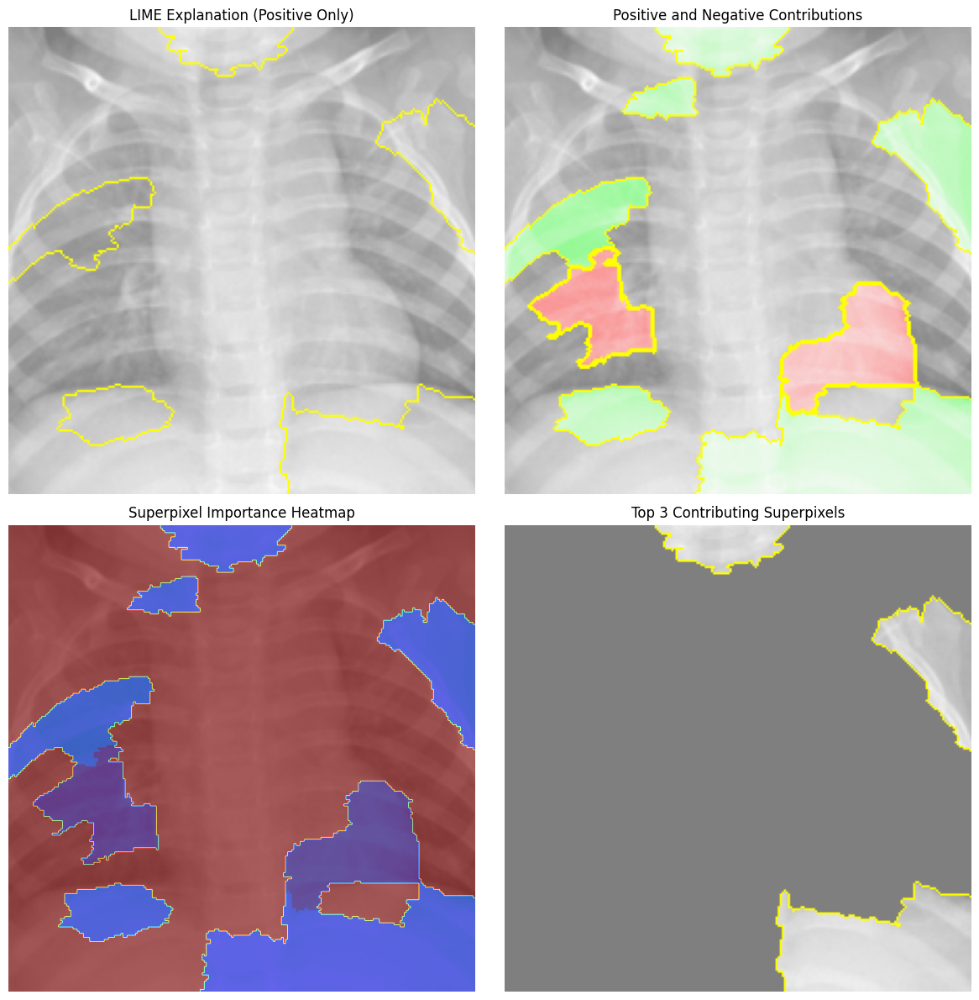

------------------------------------------------------------------------------------------------------------------------


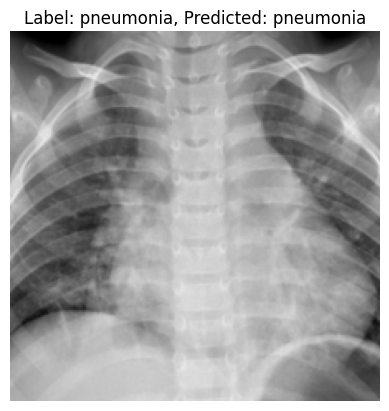

100%|███████████████████████████████████████| 1000/1000 [00:10<00:00, 92.77it/s]


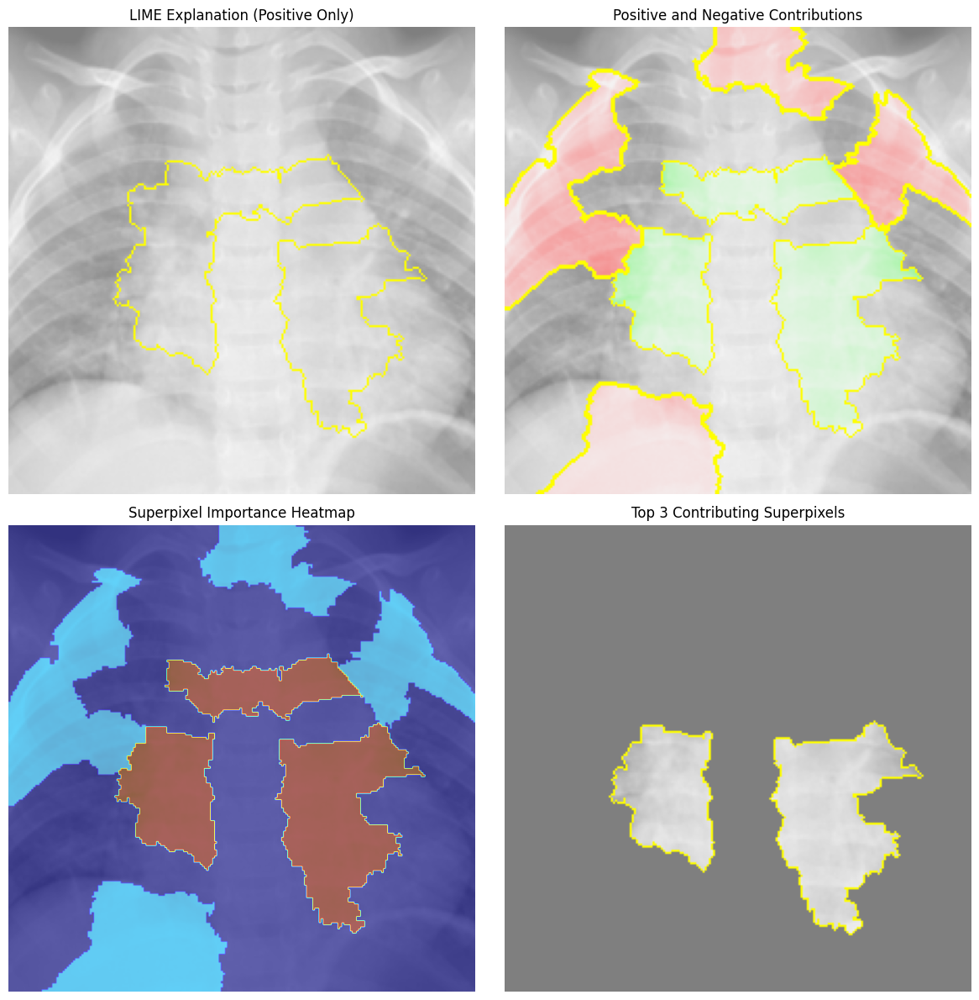

------------------------------------------------------------------------------------------------------------------------


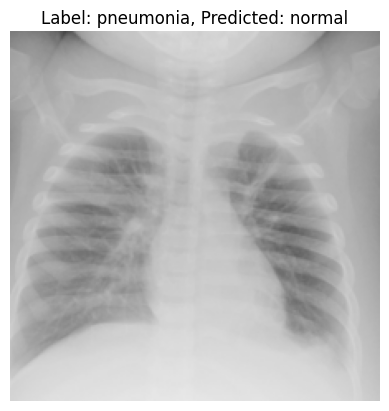

100%|███████████████████████████████████████| 1000/1000 [00:10<00:00, 95.81it/s]


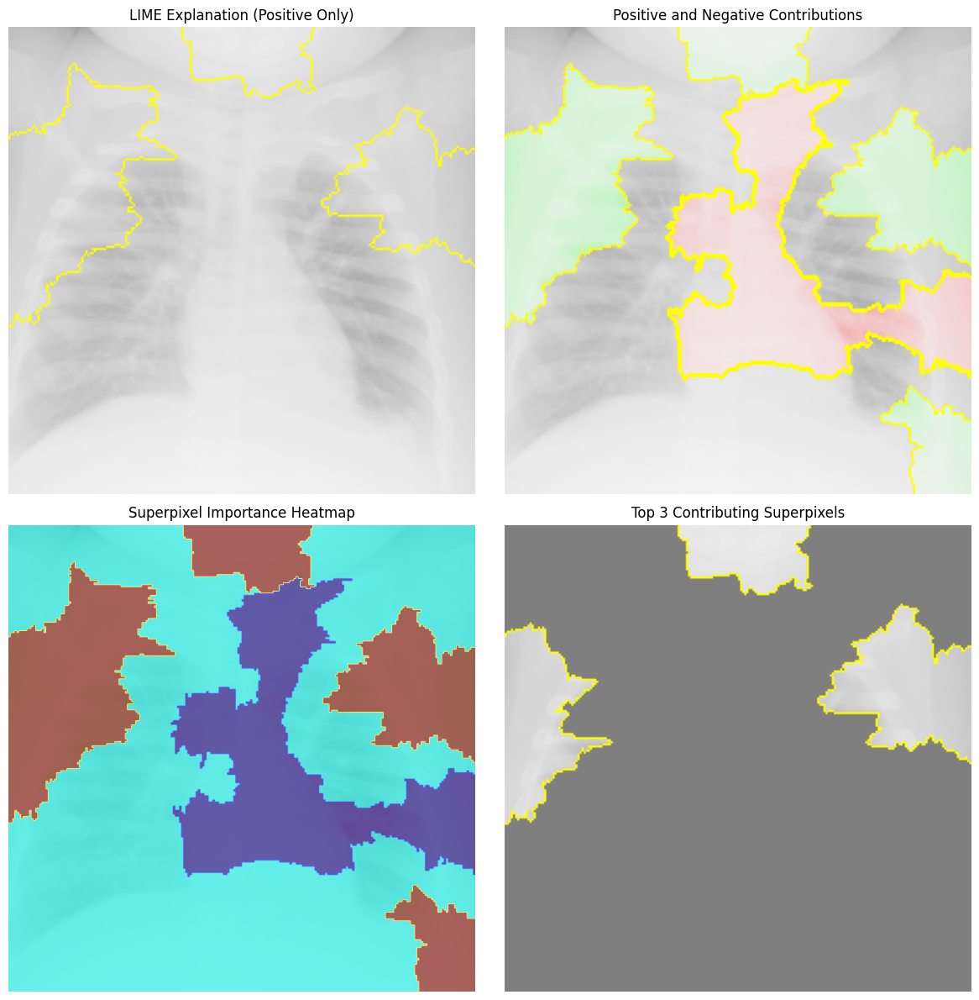

------------------------------------------------------------------------------------------------------------------------


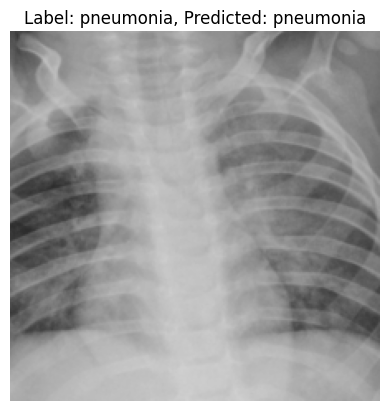

100%|███████████████████████████████████████| 1000/1000 [00:12<00:00, 77.46it/s]


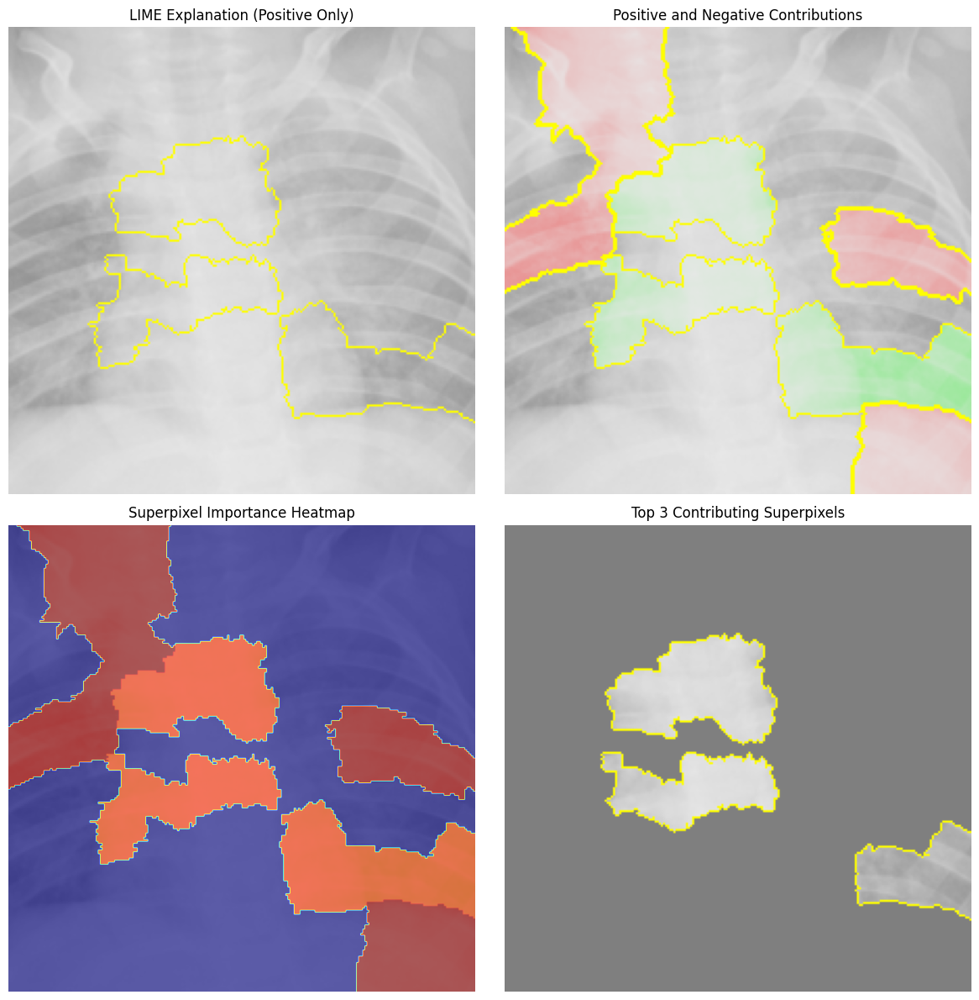

------------------------------------------------------------------------------------------------------------------------


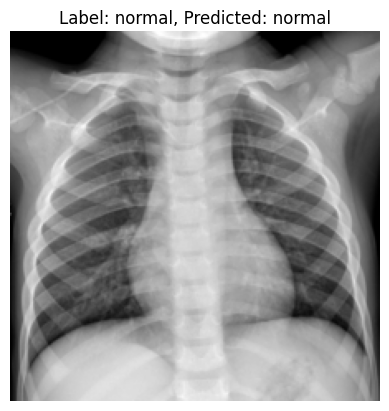

100%|███████████████████████████████████████| 1000/1000 [00:10<00:00, 94.56it/s]


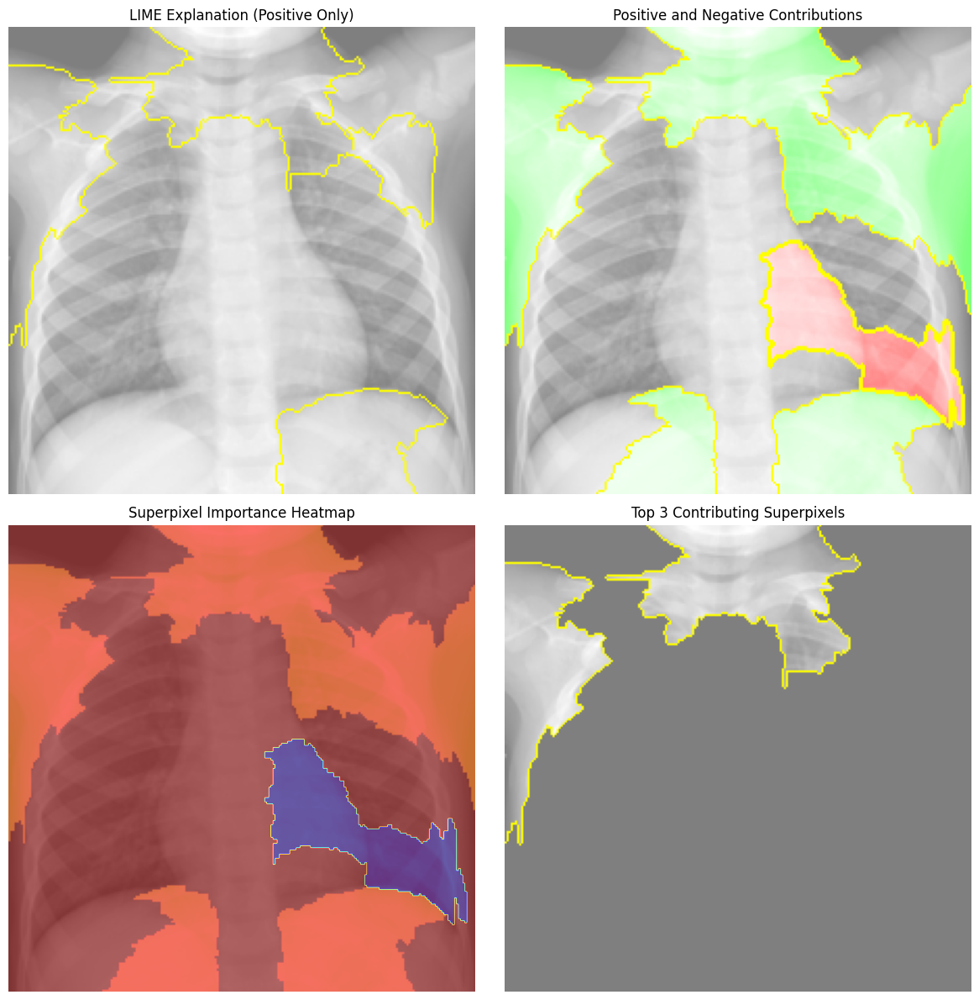

------------------------------------------------------------------------------------------------------------------------


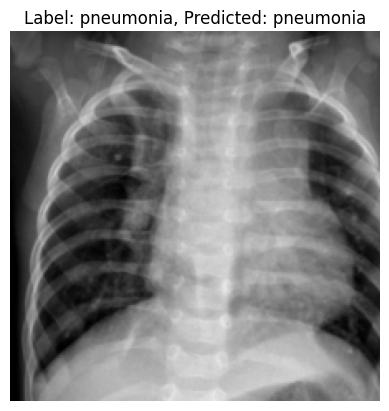

100%|███████████████████████████████████████| 1000/1000 [00:10<00:00, 96.63it/s]


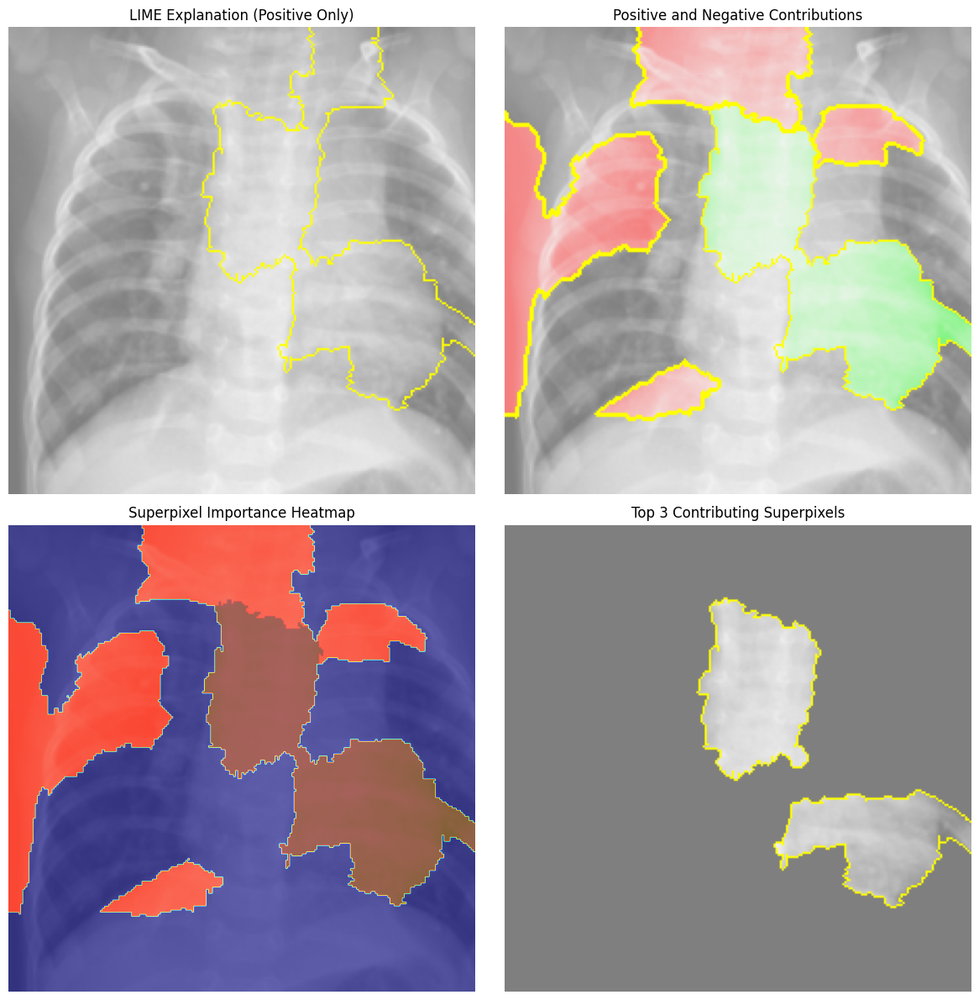

------------------------------------------------------------------------------------------------------------------------


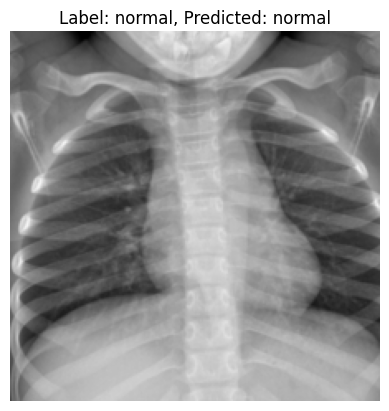

100%|███████████████████████████████████████| 1000/1000 [00:10<00:00, 93.09it/s]


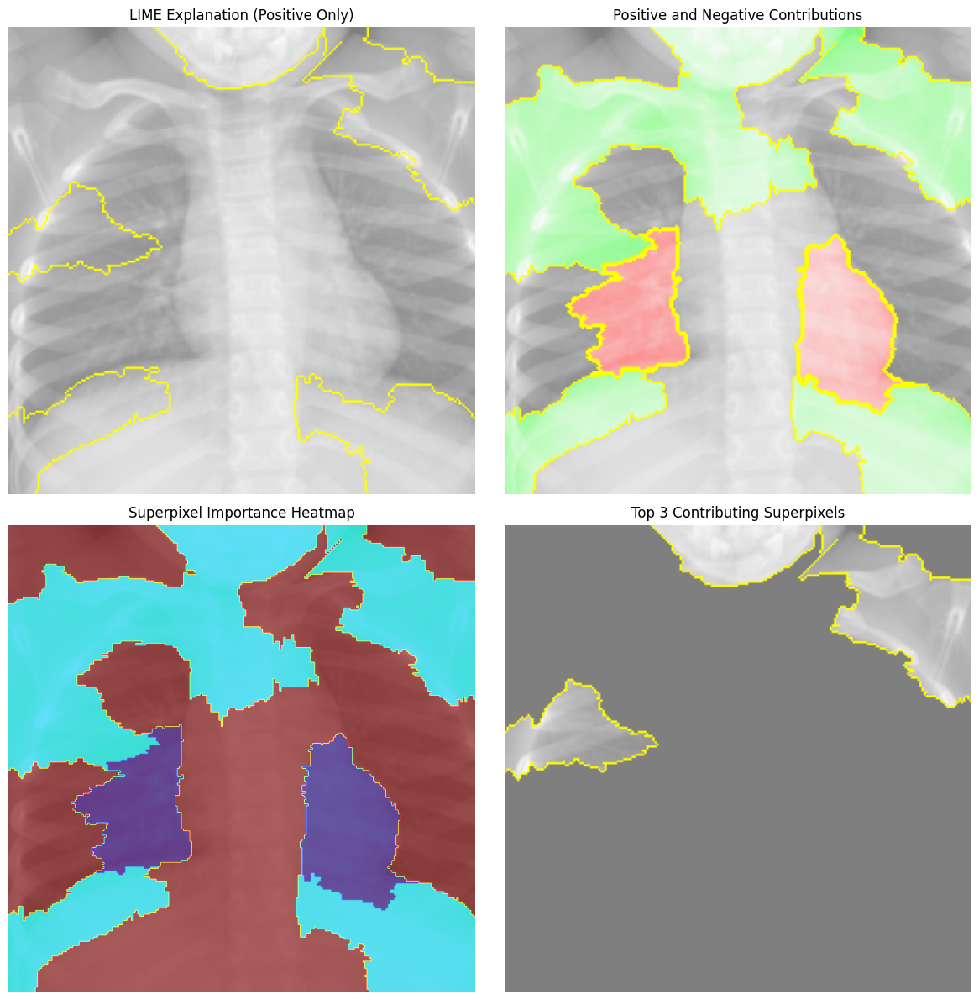

------------------------------------------------------------------------------------------------------------------------


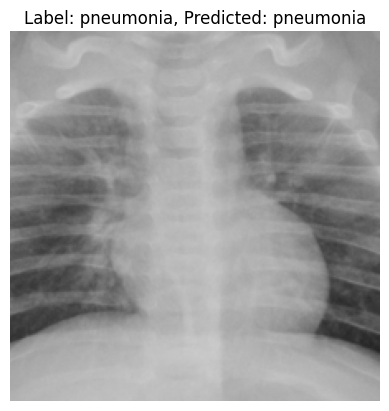

100%|███████████████████████████████████████| 1000/1000 [00:11<00:00, 89.00it/s]


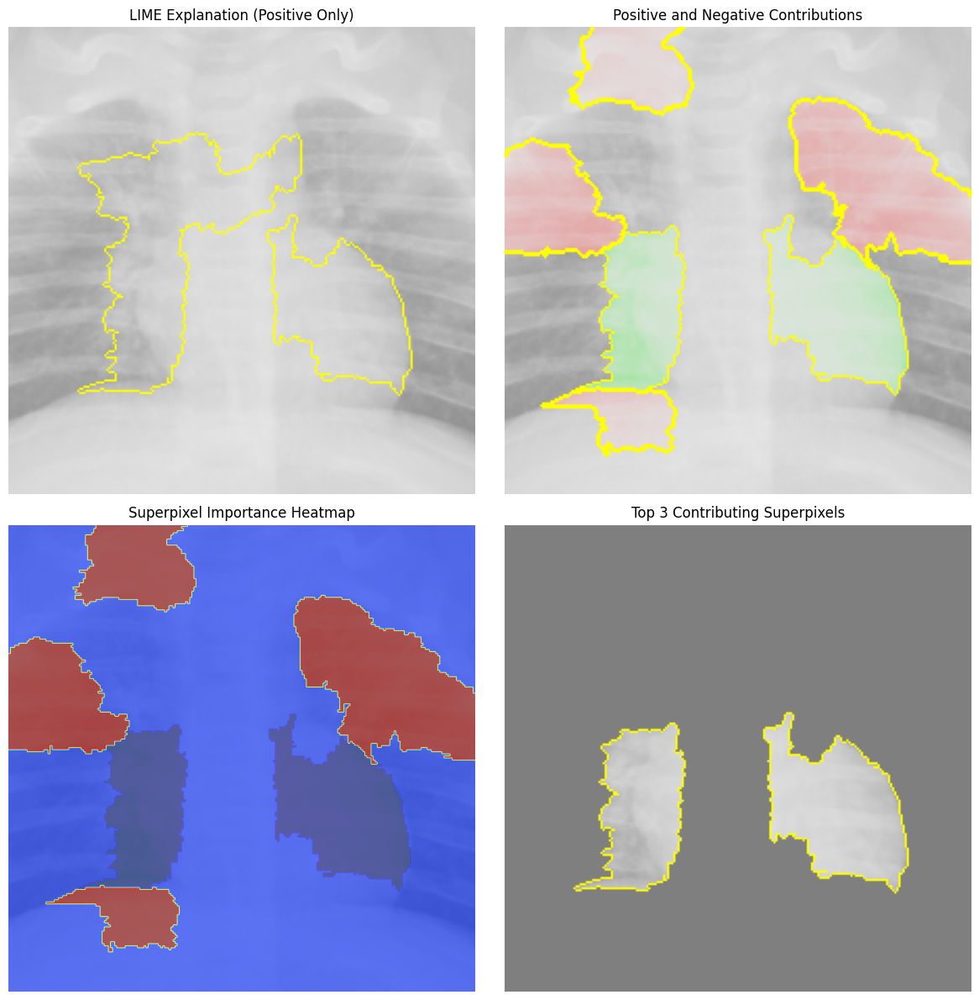

------------------------------------------------------------------------------------------------------------------------


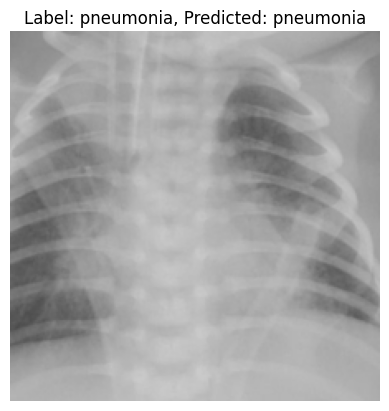

100%|███████████████████████████████████████| 1000/1000 [00:10<00:00, 93.51it/s]


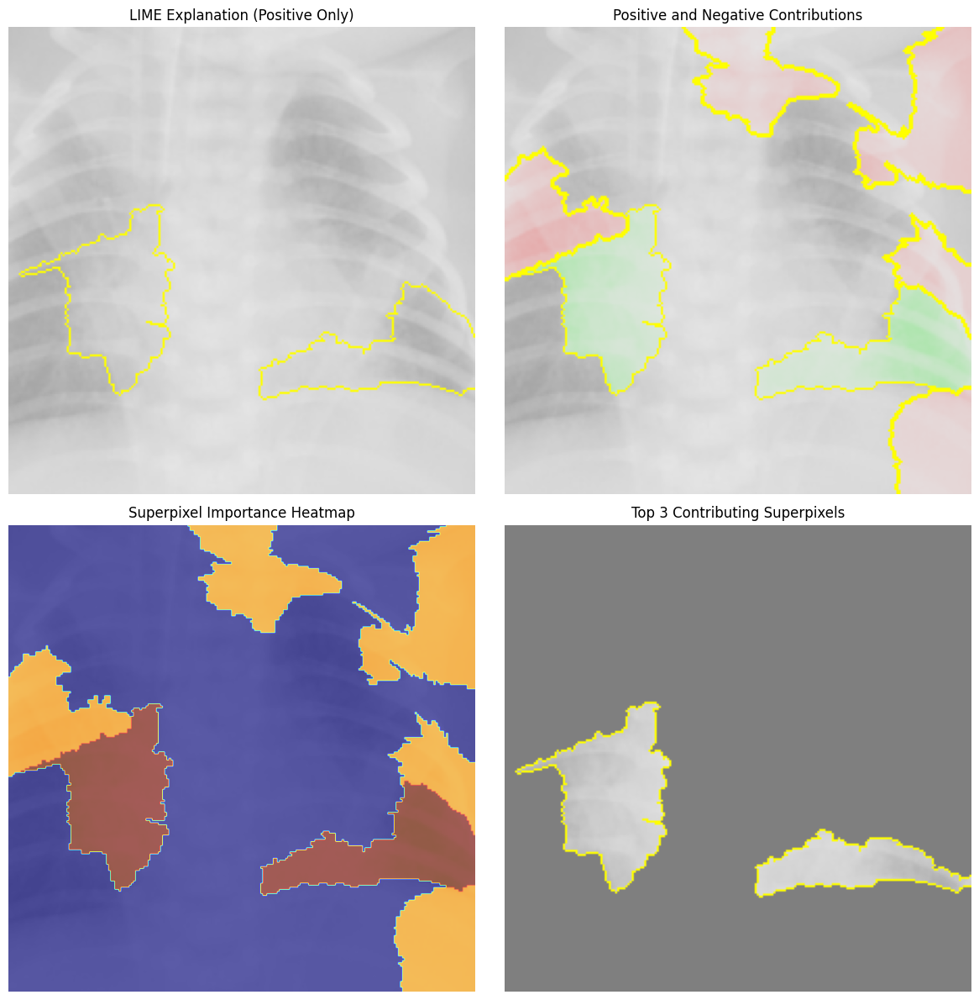

------------------------------------------------------------------------------------------------------------------------


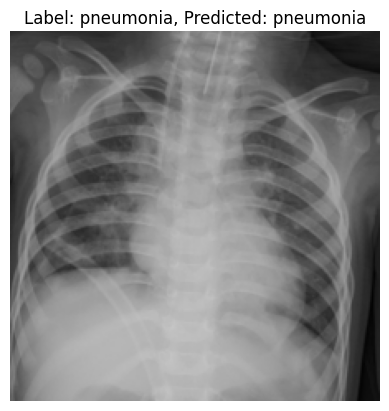

100%|███████████████████████████████████████| 1000/1000 [00:10<00:00, 95.58it/s]


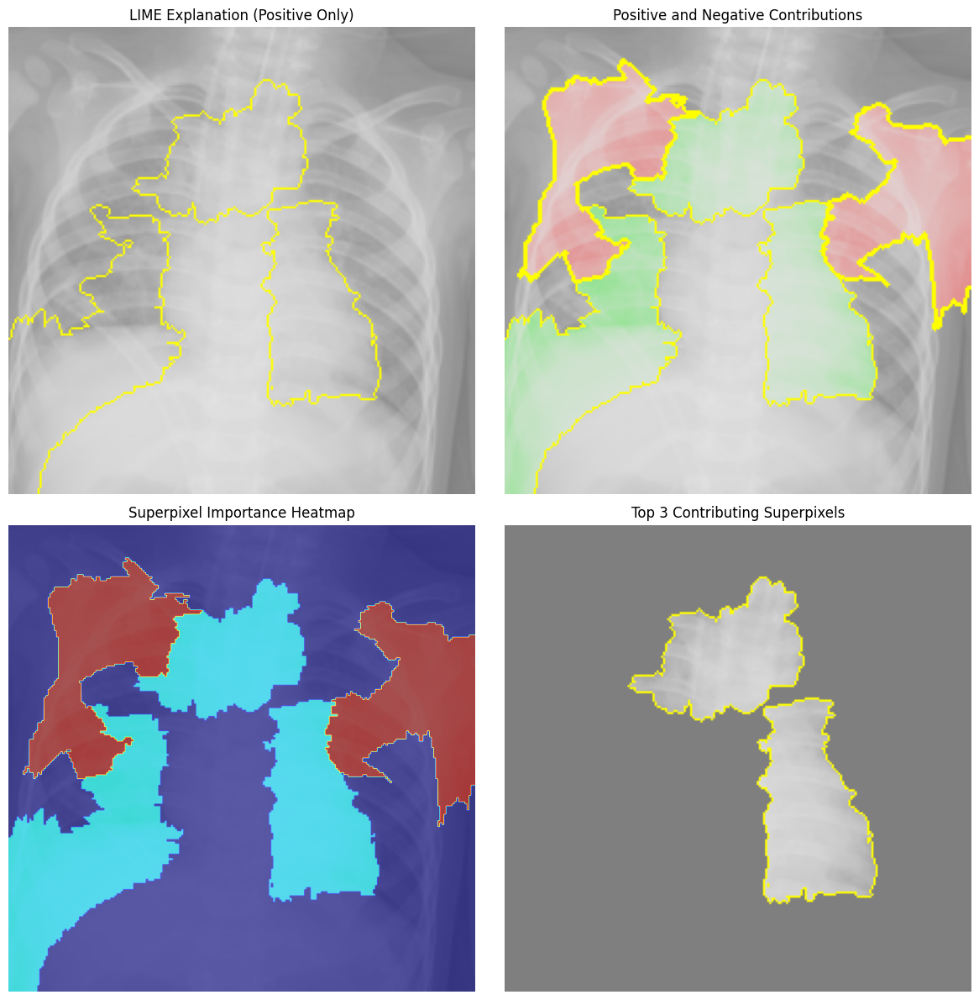

------------------------------------------------------------------------------------------------------------------------


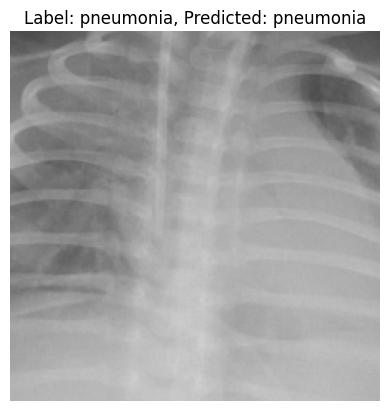

100%|███████████████████████████████████████| 1000/1000 [00:11<00:00, 88.65it/s]


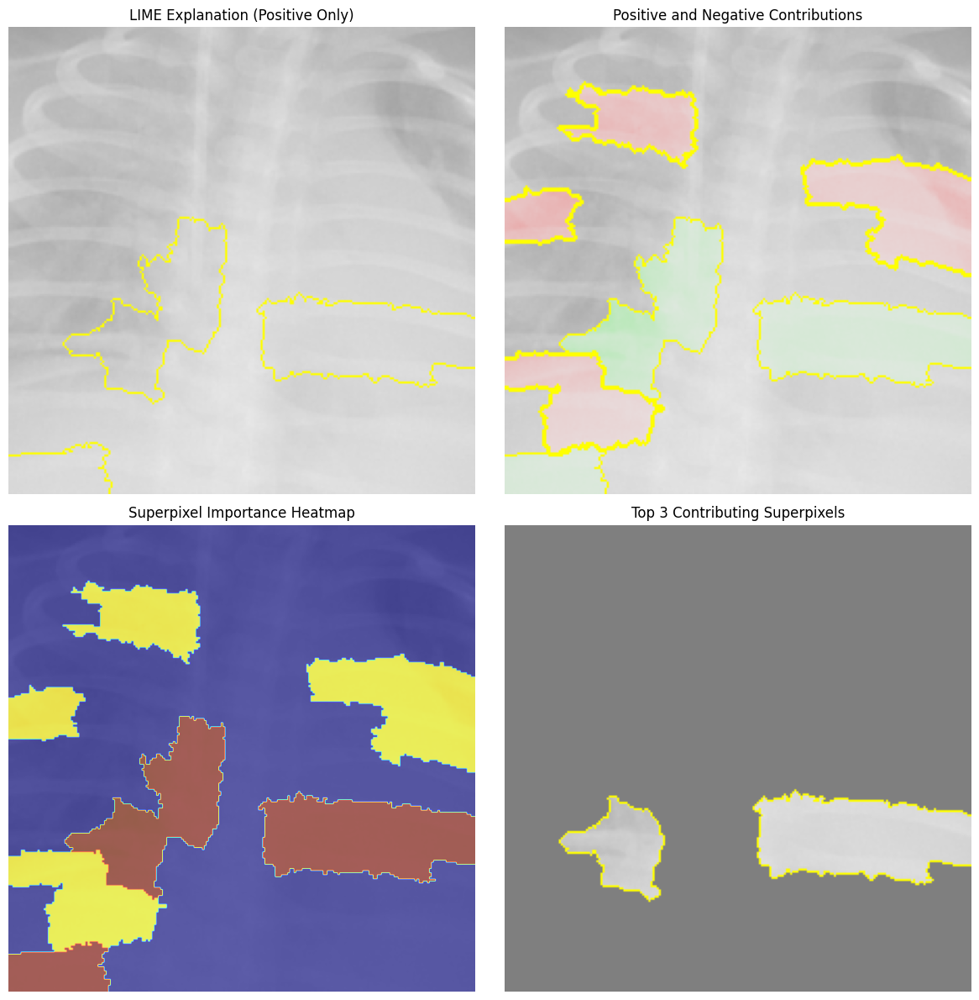

------------------------------------------------------------------------------------------------------------------------


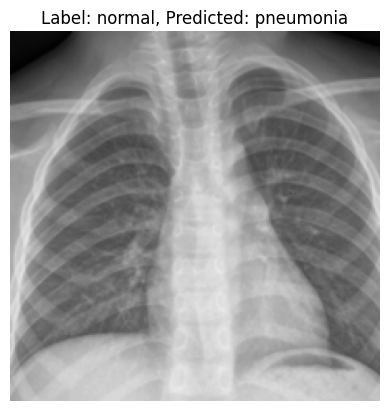

100%|███████████████████████████████████████| 1000/1000 [00:11<00:00, 86.91it/s]


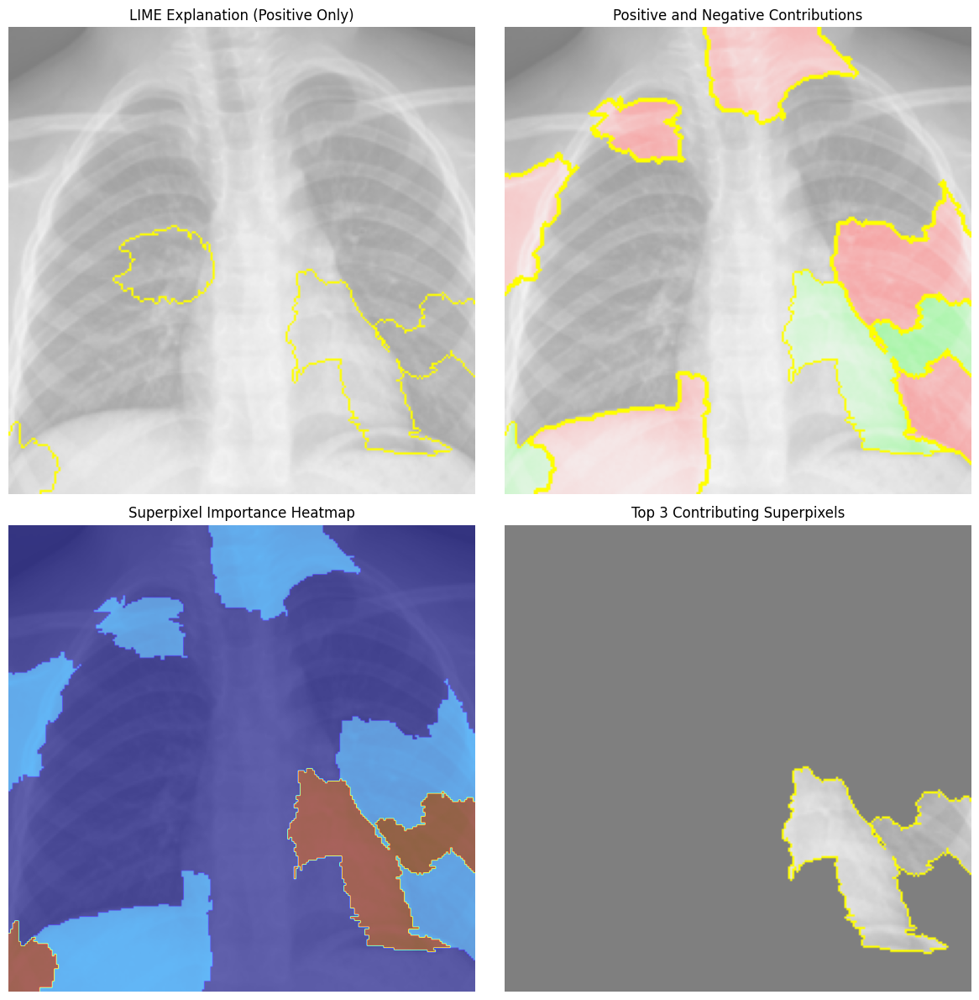

------------------------------------------------------------------------------------------------------------------------


In [22]:
for i in SAMPLE_TEST_IMAGE_INDEXES:
    lime_explain_image(model, sample_images_dicts[i], N_CLASSES, DEVICE)
    print("--------" * 15)

## Step 7 - Retrieve SHAP Explanation

In [23]:
shap_sample_images = []
shap_test_labels = []
for i in SAMPLE_TEST_IMAGE_INDEXES:
    shap_sample_images.append(sample_images_dicts[i]['image'])
    shap_test_labels.append(sample_images_dicts[i]['label'])
shap_sample_images = torch.stack(shap_sample_images)

In [24]:
shap_explainer = shap.DeepExplainer(model, sample_train_images)

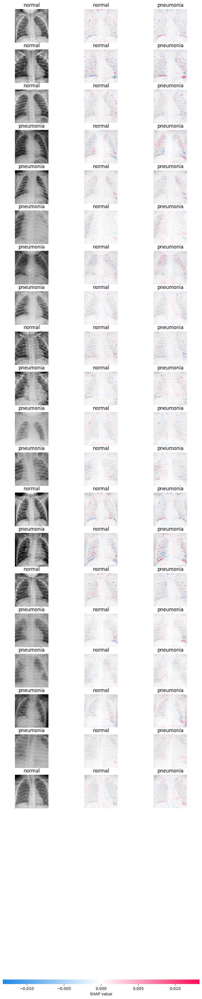

In [25]:
shap_explain_images(shap_explainer, CLASS_NAMES, shap_sample_images, shap_test_labels)

## Step 8 - Retrieve GradCAM Explanation

In [26]:
gradcam = GradCAM(model, target_layer='conv_section.7')

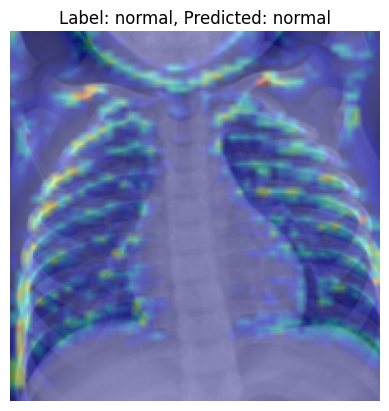

------------------------------------------------------------------------------------------------------------------------


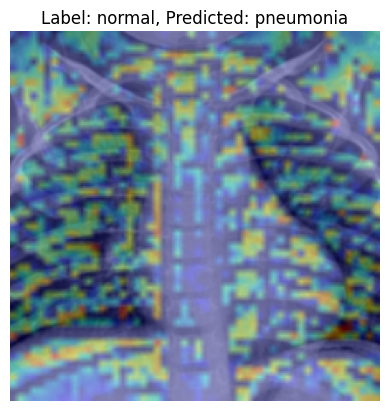

------------------------------------------------------------------------------------------------------------------------


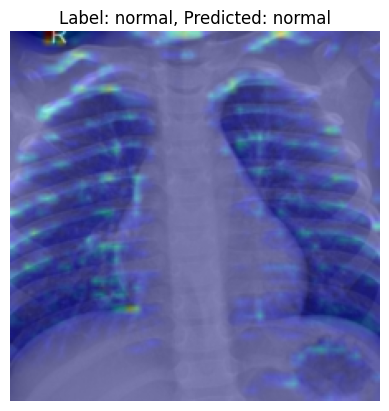

------------------------------------------------------------------------------------------------------------------------


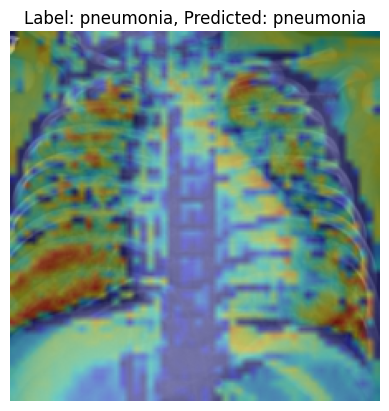

------------------------------------------------------------------------------------------------------------------------


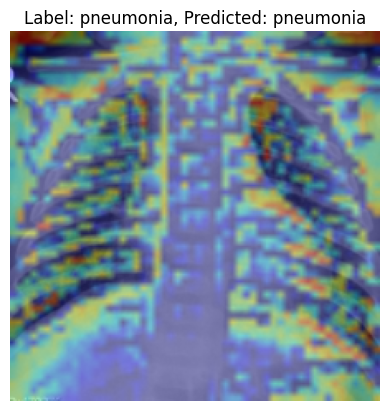

------------------------------------------------------------------------------------------------------------------------


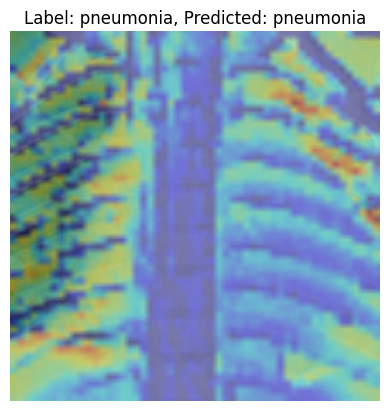

------------------------------------------------------------------------------------------------------------------------


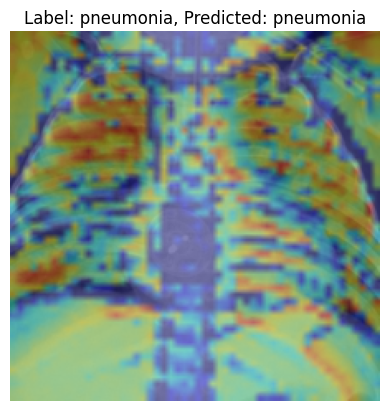

------------------------------------------------------------------------------------------------------------------------


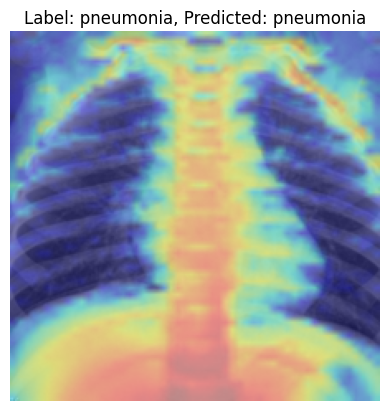

------------------------------------------------------------------------------------------------------------------------


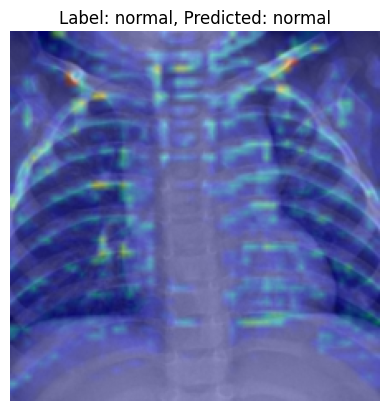

------------------------------------------------------------------------------------------------------------------------


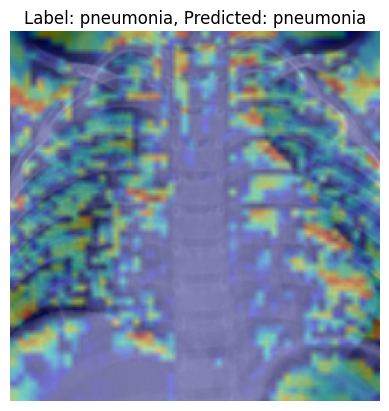

------------------------------------------------------------------------------------------------------------------------


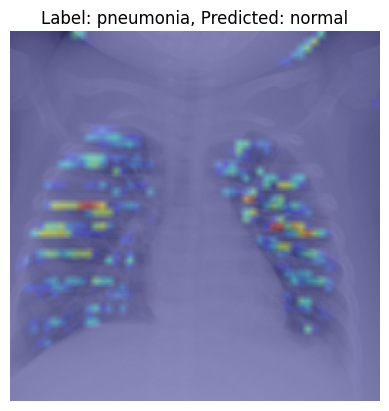

------------------------------------------------------------------------------------------------------------------------


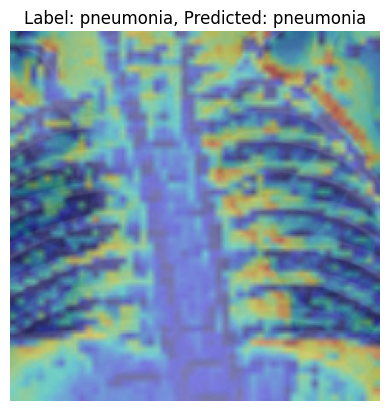

------------------------------------------------------------------------------------------------------------------------


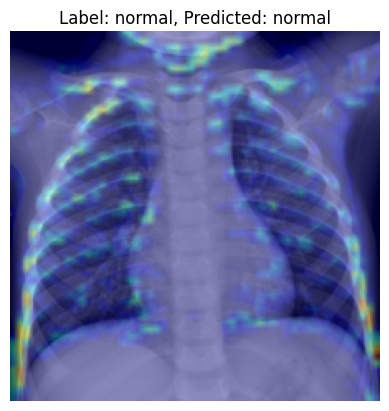

------------------------------------------------------------------------------------------------------------------------


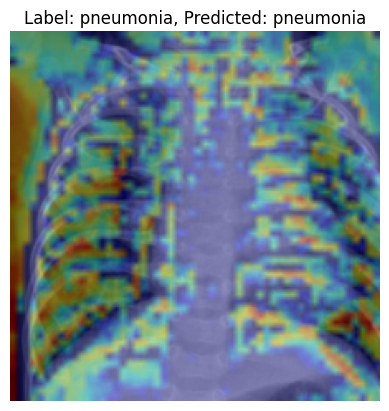

------------------------------------------------------------------------------------------------------------------------


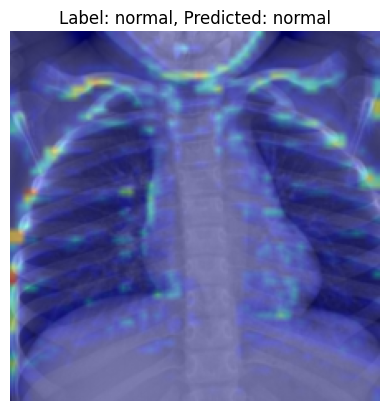

------------------------------------------------------------------------------------------------------------------------


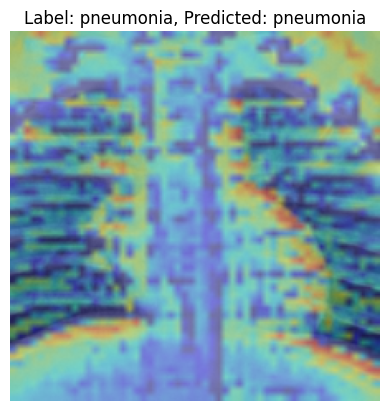

------------------------------------------------------------------------------------------------------------------------


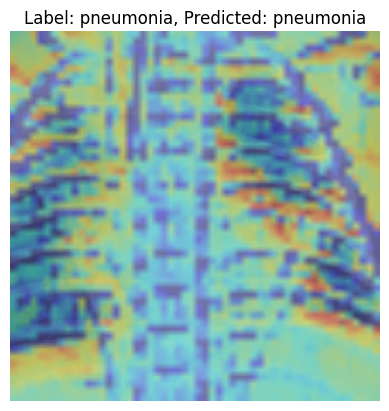

------------------------------------------------------------------------------------------------------------------------


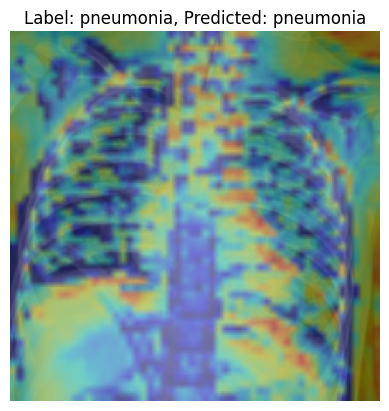

------------------------------------------------------------------------------------------------------------------------


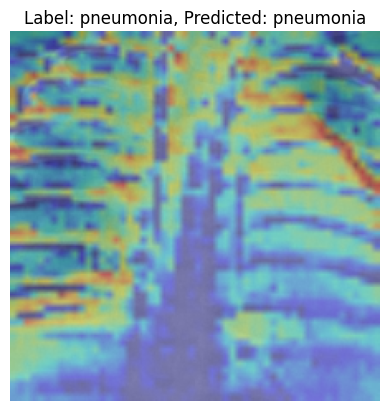

------------------------------------------------------------------------------------------------------------------------


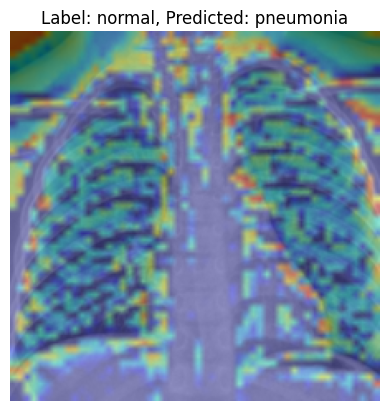

------------------------------------------------------------------------------------------------------------------------


In [27]:
for i in SAMPLE_TEST_IMAGE_INDEXES:
    heatmap = gradcam.generate_heatmap(sample_images_dicts[i]['image'], DEVICE)
    gradcam_explain_image(sample_images_dicts[i], heatmap)
    print("--------" * 15)